**Master Thesis (MUIC)**





## Install packages

In [ ]:
! pip install git+https://github.com/huggingface/transformers -q

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 13.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 97.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 57.8 MB/s eta 0:00:00


In [ ]:
#! pip install SpeechRecognition
! pip install pyphen
! pip install pydub

# Imports

In [ ]:
# Mount on Drive
from google.colab import drive
drive.mount('/content/drive/')
%cd /content/drive/My Drive/TFM_MUIC/

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).
/content/drive/My Drive/TFM_MUIC


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import re
import pandas as pd
import warnings
warnings.filterwarnings('ignore')



In [ ]:
with open('Heike_transcription.txt', 'r', encoding='utf-8') as f:
    heike_transcription = f.read()

video_path = 'Heike Lamberger-Felber AUDIO y PPT.mp4'
heike_audio = 'Heike_audio.wav'
tomas_audio = 'tomas_speech.wav'

# 1) Audio extraction from video file





In [ ]:
'''
from moviepy.editor import VideoFileClip

def extraer_audio(video_path, audio_path):
    video = VideoFileClip(video_path)
    audio = video.audio
    audio.write_audiofile(audio_path)
    audio.close()

video_path = 'Heike Lamberger-Felber AUDIO y PPT.mp4'
audio_path = 'Heike_audio.wav'


extraer_audio(video_path, audio_path)
'''

# 2) Automatic captioning with speech recognition



**Begin of Heike's speech:** 12:28 → (12×60+28)×1000 = 748000

---

**Timestamp where Heike's speech with mine's begin:** 28:10 → (28×60+10)×1000 = 1690000

---
**Timestamp where Heike's speech with mine's end:** 44:08 → (44×60+8)×1000 = 2648000

---
**Timestamp where Heike's speech ends:** 54:43 → (59*60+43) = 3583000


Then, my interpretation goes from i = 193 to i = 380

In [ ]:
AudioSegment.from_mp3("/content/Heike_audio.mp3")

## Heike

In [ ]:
start_begin =  (12*60+28)*1000
start_match =  (28*60+10)*1000
start_match_end = (44*60+8)*1000
start_end = (59*60+43)*1000


def preprocess(text):
    #text = re.sub('.,-', ' ', text)
    text = re.sub('[^0-9a-zA-ZÀ-ÖØ-öø-ÿ\n]'," ", text) #Only alphanumeric characters
    text = document = re.sub('  +|\t'," ", text) #Multiple spacing
    return text.strip()

# In Spanish, syllabic segmentation may result in single 's'
def no_singles(text):
    text =  re.sub(' [^aeiouy]($|\s)'," ", text)
    return text.strip()

### Captioning

In [ ]:
from transformers import pipeline

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# SR Model
whisper = pipeline('automatic-speech-recognition', model = 'openai/whisper-medium', generate_kwargs = {"task":"transcribe", "language":"<|de|>"} ,device = 0)

In [ ]:
import tracemalloc
tracemalloc.start()

def create_audio_segment(audio_file, start, length=5):
  end = start+length*1000
  audio = AudioSegment.from_file(audio_file)
  audio_piece = audio[start:end]
  export = audio_piece.export("test_clip.wav", format='wav')
  export.close()
  return

create_audio_segment(heike_audio, 0, length=5)

NameError: ignored

In [ ]:
transcript_segments = []

start = start_match_end
start = 0
length=5


while start < start_end:
#for i in tqdm(range(191)):
  # Create 5s clip
  create_audio_segment(audio_file=tomas_audio, start=start, length=length)
  # Transcribe
  transcription = whisper("test_clip.wav")
  # Store transcription
  transcript_segments.append(transcription['text'])
  start+=length * 1000



100%|██████████| 191/191 [08:21<00:00,  2.63s/it]


In [ ]:
# Check or test a  fragment
from IPython.display import Audio, display

create_audio_segment(audio_file=heike_audio, start=start_begin+42*length*1000, length=length)
Audio("test_clip.wav", autoplay=True)

In [ ]:
# Save transcriptions to .txt for future correction and normalization
'''
with open(r'transcript_segments.txt', 'w', encoding='utf-8') as fp:
    fp.write('\n'.join(transcript_segments))
len(transcript_segments)
'''

187

## Compute speed, histograms

**Naive speed computation**

In [ ]:
# Naive speed computation
t = re.sub('\\n', ' ',  heike_transcription) # linebreaks as spaces
v = len(t.split(' '))/(start_end - start_begin)*1000*60
print('{:.2f} words/min'.format(v))

113.23 words/min


**Segment-wise speed computation**

In [ ]:
with open(r'transcript_segments_full_corrected.txt', 'r',  encoding='utf-8') as f:
    transcript_segments = f.readlines()

len(transcript_segments)

567

In [ ]:
!pip install pyphen

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 33.2 MB/s eta 0:00:00


In [ ]:
import pyphen # hyphenation module


syll_segmenter = pyphen.Pyphen(lang='de')

syl_list = []

for text in transcript_segments:

    # Calculate words
    n_words = len(preprocess(text).split(' '))

    # Calculate syllabes
    syllabes = preprocess(' '.join([syll_segmenter.inserted(x) for x in text.split(' ')]))


    n_syl = len(syllabes.split(' '))
    syl_list.append({'# syllabes': n_syl,
                     '# words': n_words,
                     'ratio s/sec': n_syl/5,
                     'ratio w/min': n_words/5*60,
                     'text': re.sub('\n',"", text),
                     'syllabes': syllabes,
                     })

df_syl = pd.DataFrame(syl_list)



In [ ]:
df_syl.head()

,# syllabes,# words,ratio s/sec,ratio w/min,text,syllabes
0,5,4,1.0,48.0,Vielen Dank für die,Vie len Dank für die
1,12,7,2.4,84.0,"Begrüßung und die Vorstellung, die wie immer",Be grü ßung und die Vor stel lung die wie im mer
2,14,9,2.8,108.0,"so ausfällt, dass man dann glaubt, man ist je...",so aus fäll t dass man dann glaub t man ist je...
3,13,11,2.6,132.0,"Das mag ich sehr an Granada, weil man hat dan...",Das mag ich sehr an Gra na da weil man hat dan...
4,22,13,4.4,156.0,"den Eindruck, dass man eine wichtige Persönli...",den Ein druck dass man ei ne wich ti ge Per sö...


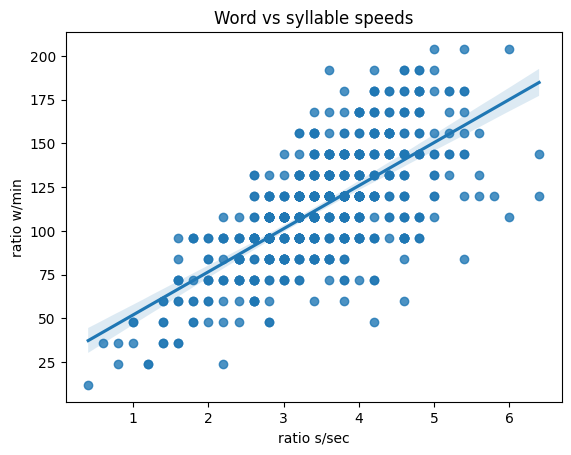

In [ ]:
# Linear regression
import seaborn as sns

sns.regplot(x="ratio s/sec", y="ratio w/min", data=df_syl);
plt.title("Word vs syllable speeds");

### Speed histogram

In [ ]:
def plot_hist(df, bins=20):

  plt.figure(figsize=(20,5))
  fig, ax = plt.subplots(figsize=(20, 5), ncols=2, nrows=1, sharey=True)
  plt.suptitle('Histogramas de la velocidad de producción de la oradora', size=30)
  ax[0].hist(df['ratio w/min'],15,edgecolor='black');

  ax[0].set_xlabel('# palabras / minuto',size=20);
  ax[0].set_ylabel('# Frecuencia absoluta',size=20);

  ax[1].hist(df['ratio s/sec'],bins,edgecolor='black', alpha=1, color = 'orange');
  ax[1].set_xlabel('# sílabas / segundo',size=20);

  mean_s = np.mean(df['ratio s/sec'])
  std_s = np.std(df['ratio s/sec'])
  mean_w = np.mean(df['ratio w/min'])
  std_w = np.std(df['ratio w/min'])

  print('{:.1f}+/- {:.1f} syllabes per second'.format(mean_s, std_s))
  print('{:.2f}+/- {:.2f} words per minute'.format(mean_w, std_w))

  return fig, ax

3.5+/- 1.0 syllabes per second
113.63+/- 33.76 words per minute


<Figure size 2000x500 with 0 Axes>

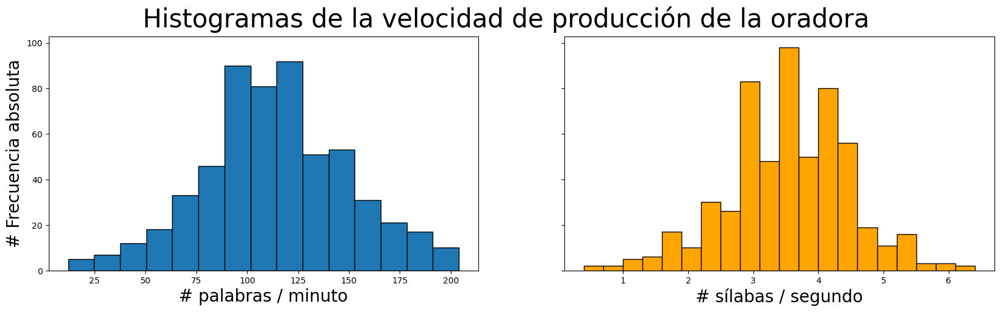

In [ ]:
fig, ax = plot_hist(df_syl);

3.5+/- 0.9 syllabes per second
109.93+/- 33.77 words per minute


Text(0.5, 1.1, 'Histogramas de la velocidad de producción de la oradora\n (Fragmento a evaluar)')

<Figure size 2000x500 with 0 Axes>

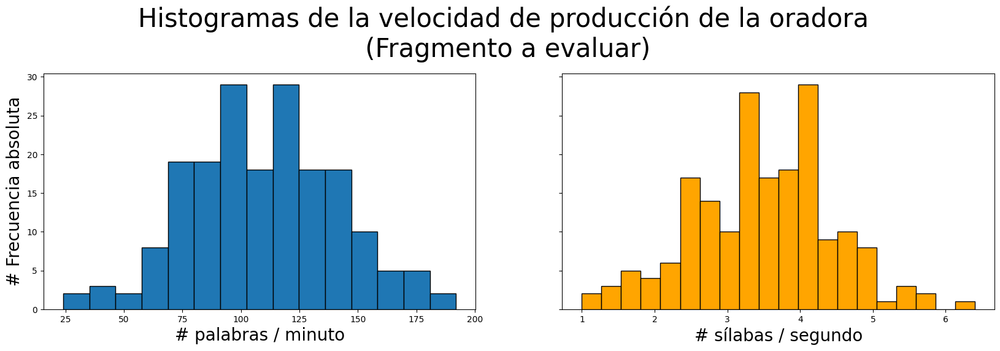

In [ ]:
df_mine = df_syl[193:380] # Select overlapping fragment
fig, ax =  plot_hist(df_mine,20);

plt.suptitle('Histogramas de la velocidad de producción de la oradora\n (Fragmento a evaluar)', size=30, y = 1.1)

### Time series

In [ ]:
def plot_ts(df, alpha =1):

  plt.figure()

  time = np.arange(0, len(df))*5
  fig, ax = plt.subplots(figsize=(20, 10), ncols=1, nrows=2, sharex=True)

  ax[0].set_title('Series temporales para las velocidades de producción de la oradora', size=30)

  ax[0].plot(time ,df['# words'], alpha=alpha)
  ax[0].set_ylabel('# palabras',size=20);

  ax[1].plot(time, df['# syllabes'], color = 'orange', alpha=alpha)
  ax[1].set_ylabel('# sílabas',size=20);
  ax[1].set_xlabel('Tiempo [s]',size=20);
  return fig, ax



<Figure size 640x480 with 0 Axes>

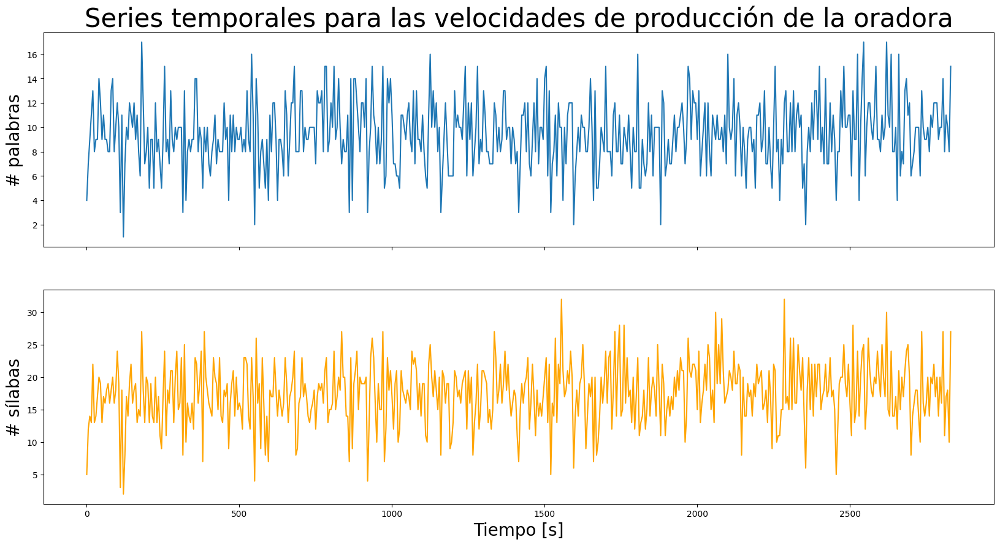

In [ ]:
fig, ax = plot_ts(df_syl);

Text(0.5, 1.1, 'Series temporales para las velocidades de producción de la oradora\n(Fragmento a evaluar)')

<Figure size 640x480 with 0 Axes>

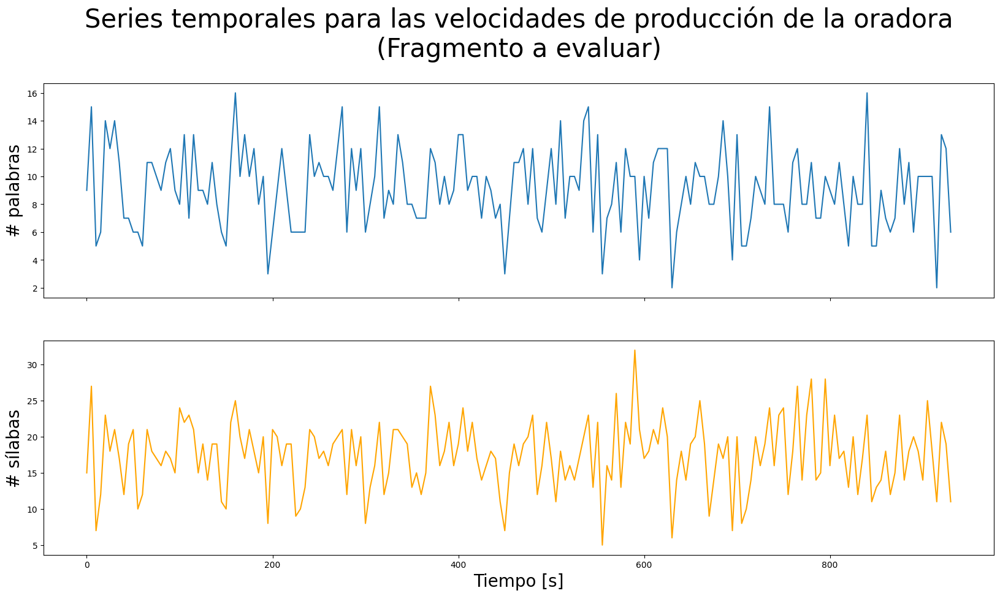

In [ ]:
fig, ax = plot_ts(df_mine);
ax[0].set_title('Series temporales para las velocidades de producción de la oradora\n(Fragmento a evaluar)', size=30, y = 1.1)

## Tomás

In [ ]:
whisper = pipeline('automatic-speech-recognition', model = 'openai/whisper-medium', generate_kwargs = {"task":"transcribe", "language":"<|de|>"} ,device = 0)

In [ ]:

transcript_segments = []

start = start_match_end
start = 0
length=5


#while start < start_end_match:
for i in tqdm(range(191)):
  create_audio_segment(audio_file=tomas_audio, start=start, length=length)

  transcription = whisper("test_clip.wav")
  transcript_segments.append(transcription['text'])
  start+=length * 1000


In [ ]:
# Save to .txt for future correction and normalization
'''
with open(r'transcript_segments_t.txt', 'w', encoding='utf-8') as fp:
    fp.write('\n'.join(transcript_segments))
len(transcript_segments)
'''


In [ ]:
with open(r'transcript_segments_t_corrected.txt', 'r',  encoding='utf-8') as f:
    transcript_segments_t = f.readlines()

In [ ]:
def preprocess(text):
    #text = re.sub('.,-', ' ', text)
    text = re.sub('[^0-9a-zA-ZÀ-ÖØ-öø-ÿ\n]'," ", text) #Only alphanumeric characters
    text = document = re.sub('  +|\t'," ", text) #Multiple spacing
    return text.strip()

# In Spanish, syllabic segmentation may result in single 's'
def no_singles(text):
    text =  re.sub(' [^aeiouy]($|\s)'," ", text)
    return text.strip()


import unicodedata

def remove_accents(input_str):
    nfkd_form = unicodedata.normalize('NFKD', input_str)
    only_ascii = nfkd_form.encode('ASCII', 'ignore')
    return str(only_ascii)

syll_segmenter = pyphen.Pyphen(lang='es')

syl_list = []

for text in transcript_segments_t:

    # Calculate words
    n_words = len(preprocess(text).split(' '))

    # Calculate syllabes
    syllabes = preprocess(' '.join([syll_segmenter.inserted(x) for x in text.split(' ')]))
    #syllabes = remove_accents(syllabes)
    syllabes = no_singles(syllabes)

    n_syl = len(syllabes.split(' '))
    syl_list.append({'# syllabes': n_syl,
                     '# words': n_words,
                     'ratio s/sec': n_syl/5,
                     'ratio w/min': n_words/5*60,
                     'text': re.sub('\n',"", text),
                     'syllabes': syllabes,
                     })

df_syl_t = pd.DataFrame(syl_list)


### Speed histogram

3.1+/- 1.2 syllabes per second
97.45+/- 38.99 words per minute


Text(0.5, 0.98, 'Histogramas de las velocidad de producción del intérprete')

<Figure size 2000x500 with 0 Axes>

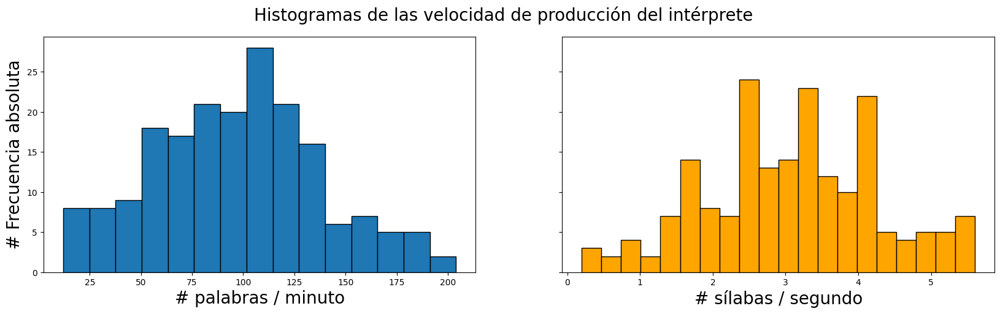

In [ ]:
fig, ax =  plot_hist(df_syl_t,20)
plt.suptitle('Histogramas de las velocidad de producción del intérprete', size=20)

### Time series

Text(0.5, 1.0, 'Series temporales para las velocidades de producción del intérprete')

<Figure size 640x480 with 0 Axes>

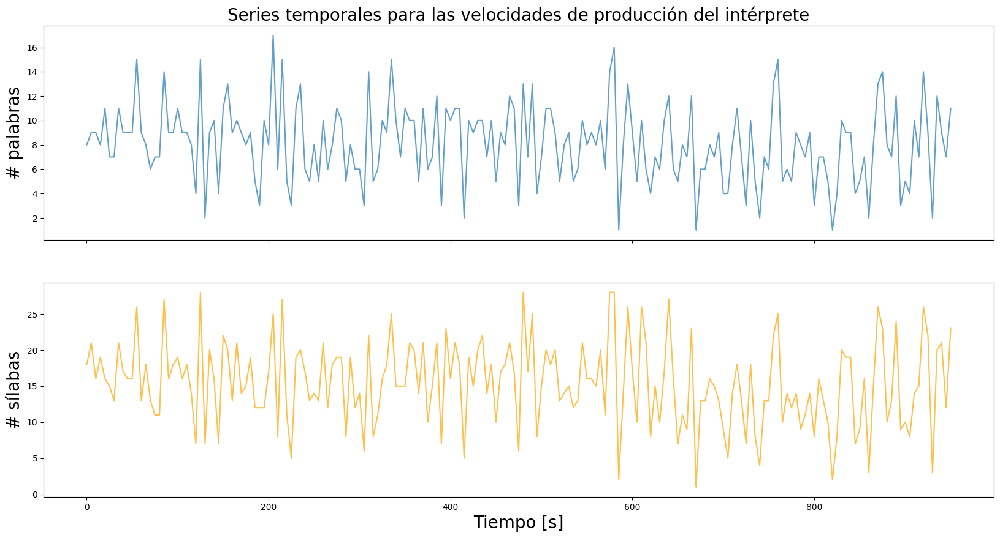

In [ ]:
fig, ax = plot_ts(df_syl_t, alpha =0.7)
ax[0].set_title('Series temporales para las velocidades de producción del intérprete', size=20)

## Correct silences

In [ ]:
from pydub.silence import split_on_silence, detect_nonsilent
from pydub import AudioSegment, effects
from scipy.io.wavfile import read, write


def create_audio_segment(audio_file, start, length=5):
  end = start+length*1000
  audio = AudioSegment.from_file(audio_file)
  audio_piece = audio[start:end]
  export = audio_piece.export("test_clip.wav", format='wav')
  export.close()
  return



def compare_silence(path):
    rate, audio = read(path)

    aud = AudioSegment(audio.tobytes(),frame_rate = rate,
                        sample_width = audio.dtype.itemsize,channels = 1)
    audio_original= np.array(aud.get_array_of_samples())

    audio_chunks = split_on_silence(
        aud,
        min_silence_len = 150,
        silence_thresh = -35,
        keep_silence = 50,
        )

    audio_processed = sum(audio_chunks)
    dbfs=audio_processed.dBFS
    audio_processed = np.array(audio_processed.get_array_of_samples())

    return len(audio_processed)/(len(audio_original)+1)


In [ ]:
# Main loop
'''
start = start_begin
lengths = []
for i in tqdm(range(567)):
  create_audio_segment(audio_file="/content/Heike_audio.wav", start=start, length=5)
  l = compare_silence("test_clip.wav")
  lengths.append(l)
  start= start+5*1000
'''

100%|██████████| 567/567 [16:24<00:00,  1.74s/it]


In [ ]:
# Save as .txt
'''
with open(r'lengths.txt', 'w', encoding='utf-8') as fp:
    for line in lengths:
        fp.write("%s\n" % line)
'''

In [ ]:
lengths = np.loadtxt('lengths.txt')

In [ ]:
df_syl['sec'] = 5*np.array(lengths)
df_syl['ratio w/min corr'] =  df_syl['# words'] / df_syl['sec'] * 60
df_syl['ratio s/sec corr'] = df_syl['# syllabes'] / df_syl['sec']

6.07+/- 1.18 syllabes per second


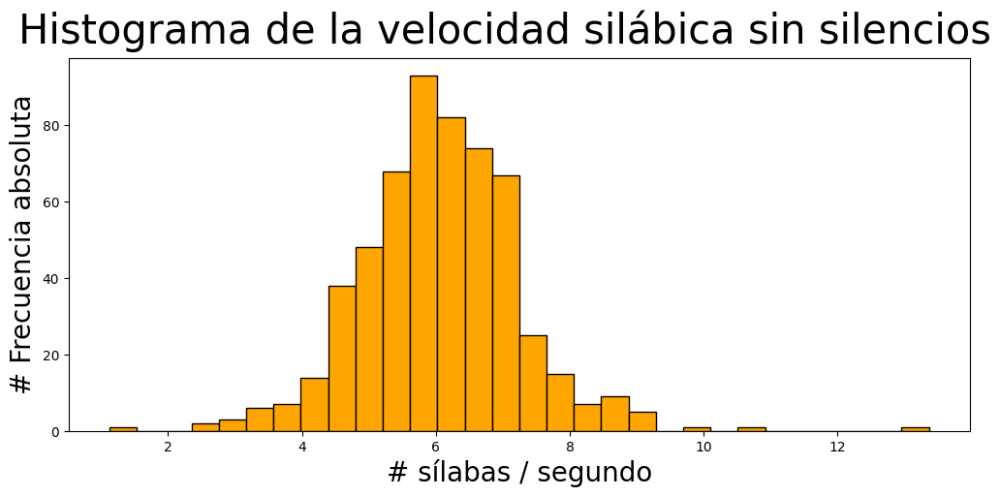

In [ ]:
bins=30

plt.figure(figsize=(12,5))

plt.hist(df_syl['ratio s/sec corr'],bins,edgecolor='black', alpha=1, color = 'orange');
plt.xlabel('# sílabas / segundo',size=20);
plt.ylabel('# Frecuencia absoluta',size=20);
plt.suptitle('Histograma de la velocidad silábica sin silencios', size=30)
mean_s = np.mean(df_syl['ratio s/sec corr'])
std_s = np.std(df_syl['ratio s/sec corr'])


print('{:.2f}+/- {:.2f} syllabes per second'.format(mean_s, std_s))


6.1+/- 1.2 syllabes per second
198.20+/- 50.02 words per minute


<Figure size 2000x500 with 0 Axes>

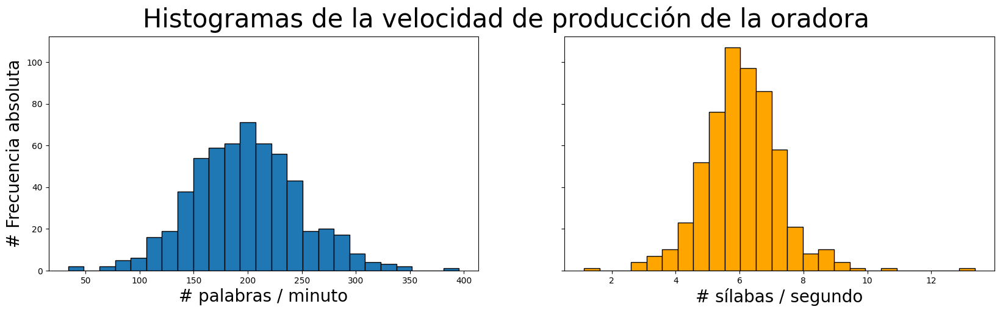

In [ ]:

bins=25

plt.figure(figsize=(20,5))
fig, ax = plt.subplots(figsize=(20, 5), ncols=2, nrows=1, sharey=True)
plt.suptitle('Histogramas de la velocidad de producción de la oradora', size=30)
ax[0].hist(df_syl['ratio w/min corr'],bins,edgecolor='black');

ax[0].set_xlabel('# palabras / minuto',size=20);
ax[0].set_ylabel('# Frecuencia absoluta',size=20);

ax[1].hist(df_syl['ratio s/sec corr'],bins,edgecolor='black', alpha=1, color = 'orange');
ax[1].set_xlabel('# sílabas / segundo',size=20);

mean_s = np.mean(df_syl['ratio s/sec corr'])
std_s = np.std(df_syl['ratio s/sec corr'])
mean_w = np.mean(df_syl['ratio w/min corr'])
std_w = np.std(df_syl['ratio w/min corr'])

print('{:.1f}+/- {:.1f} syllabes per second'.format(mean_s, std_s))
print('{:.2f}+/- {:.2f} words per minute'.format(mean_w, std_w))

# Misc

## Delete silence from audio

In [ ]:
from pydub.silence import split_on_silence, detect_nonsilent
from pydub import AudioSegment, effects
from scipy.io.wavfile import read, write

path = 'test_clip.wav'
rate, audio = read(path)
# make the audio in pydub audio segment format
aud = AudioSegment(audio.tobytes(),frame_rate = rate,
                        sample_width = audio.dtype.itemsize,channels = 1)

audio_original= np.array(aud.get_array_of_samples())

# Split the audio based on the silence,

audio_chunks = split_on_silence(
        aud,
        min_silence_len = 150,
        silence_thresh = -35, # In dBFS
        keep_silence = 50,
        )

# Combine audio chunks
audio_processed = sum(audio_chunks)
dbfs=audio_processed.dBFS
audio_processed = np.array(audio_processed.get_array_of_samples())

<Figure size 2000x500 with 0 Axes>

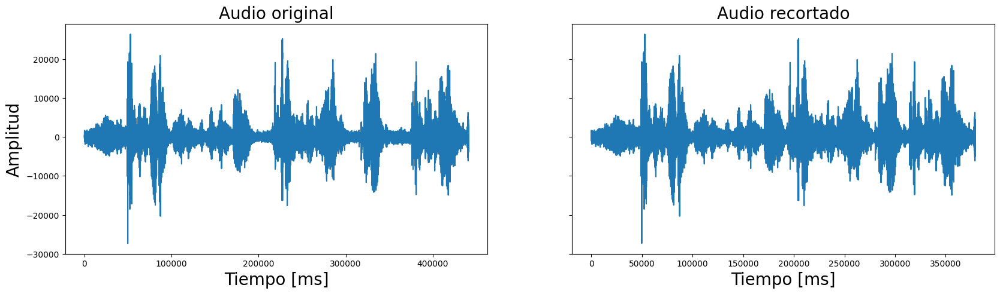

In [ ]:
plt.figure(figsize=(20,5))
fig, ax = plt.subplots(figsize=(20, 5), ncols=2, nrows=1, sharey=True)
#plt.suptitle('Histogramas de la velocidad de producción de la oradora', size=30)
ax[0].plot(audio_original);
ax[0].set_title('Audio original',size=20);
ax[0].set_xlabel('Tiempo [ms]',size=20);
ax[0].set_ylabel('Amplitud',size=20);

ax[1].plot(audio_processed);
ax[1].set_title('Audio recortado',size=20);
ax[1].set_xlabel('Tiempo [ms]',size=20);


## Automatic captioning

**From Freesubtitles.ai**

These captions have irregular time intervals, leading to a different distribution.


In [ ]:
import pyphen
import re
import pandas as pd


def preprocess(text):
    #text = re.sub('.,-', ' ', text)
    text = re.sub('[^0-9a-zA-ZÀ-ÖØ-öø-ÿ\n]'," ", text) #Only alphanumeric characters
    text = document = re.sub('  +|\t'," ", text) #Multiple spacing
    return text.strip()

def no_singles(text):
    text =  re.sub(' [^aeiouy]($|\s)'," ", text)
    return text.strip()

syll_segmenter = pyphen.Pyphen(lang='es')

syl_list = []

for i in range(2, len(transcription),3):
    timestamp = transcription[i]
    text = transcription[i+1]

    #Calculate time
    secs = float(timestamp[-10:-8])*60 + float(timestamp[-7:]) - float(timestamp[3:5])*60 - float(timestamp[6:12])

    # Calculate words
    n_words = len(preprocess(text).split(' '))

    # Calculate syllabes
    syllabes = preprocess(' '.join([syll_segmenter.inserted(x) for x in text.split(' ')]))
    syllabes = no_singles(syllabes) # Correct single consonants

    n_syl = len(syllabes.split(' '))
    syl_list.append({'timestamp': timestamp[:-2],
                     'seconds': secs,
                     '# syllabes': n_syl,
                     '# words': n_words,
                     'ratio s/sec': n_syl/secs,
                     'ratio w/sec': n_words/secs,
                     'text': re.sub('\n',"", text),
                     'syllabes': syllabes,

                     })

df_syl = pd.DataFrame(syl_list)
#df_syl = df_syl[~(df_syl['seconds'] <= 2)]

'''
syl_list

with open('syl_list.txt', 'w',encoding='utf-8') as f:
    for line in syl_list:
        f.write("{} \t {} \n".format(line[0], line[1]))
''';

NameError: ignored

In [ ]:
df_syl

,timestamp,seconds,# syllabes,# words,ratio s/sec,ratio w/sec,text,syllabes
0,00:00:00.860 --> 00:00:03.12,2.26,11,5,4.867257,2.212389,Y en materia política también,Y en ma te ria po lí ti ca tam bién
1,00:00:03.120 --> 00:00:05.40,2.28,8,4,3.508772,1.754386,"pasaron muchas cosas, la",pa sa ron mu chas co sas la
2,00:00:05.400 --> 00:00:07.98,2.58,12,5,4.651163,1.937984,"reunificación de Alemania, un tema",reu ni fi ca ción de Ale ma nia un te ma
3,00:00:07.980 --> 00:00:10.68,2.70,10,5,3.703704,1.851852,de importancia capital que nos,de im por tan cia ca pi tal que no
4,00:00:10.680 --> 00:00:13.06,2.38,11,6,4.621849,2.521008,ocupó a todos nosotros [eh...] centro,ocu pó a to dos no so tros eh cen tro
...,...,...,...,...,...,...,...,...
289,00:15:43.260 --> 00:15:44.02,0.76,4,2,5.263158,2.631579,últimos años.,úl ti mos año
290,00:15:44.020 --> 00:15:46.50,2.48,8,5,3.225806,2.016129,También crece el miedo al,Tam bién cre ce el mie do al
291,00:15:46.500 --> 00:15:51.48,4.98,11,5,2.208835,1.004016,terrorismo y se considera que,te rro ris mo y se con si de ra que
292,00:15:51.480 --> 00:15:53.14,1.66,10,6,6.024096,3.614458,muchos de estos progresos que se,mu chos de es tos pro gre sos que se


<Figure size 1440x360 with 0 Axes>

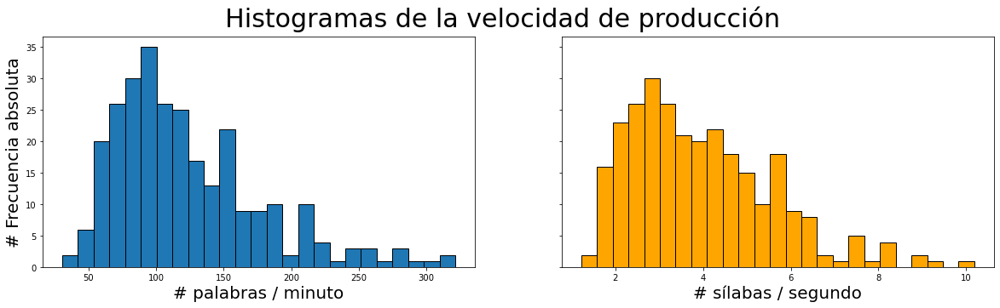

In [ ]:
import matplotlib.pyplot as plt

df_plot = df_syl[~(df_syl['seconds'] <= 1)]

plt.figure(figsize=(20,5))
fig, ax = plt.subplots(figsize=(20, 5), ncols=2, nrows=1, sharey=True)
plt.suptitle('Histogramas de la velocidad de producción', size=30)
ax[0].hist(df_plot['ratio w/sec']*60,25,edgecolor='black', alpha=1);

ax[0].set_xlabel('# palabras / minuto',size=20);
ax[0].set_ylabel('# Frecuencia absoluta',size=20);

ax[1].hist(df_plot['ratio s/sec'],25,edgecolor='black', alpha=1, color = 'orange');
ax[1].set_xlabel('# sílabas / segundo',size=20);

Palabras/minuto:128.61 ± 62.317387


<Figure size 432x288 with 0 Axes>

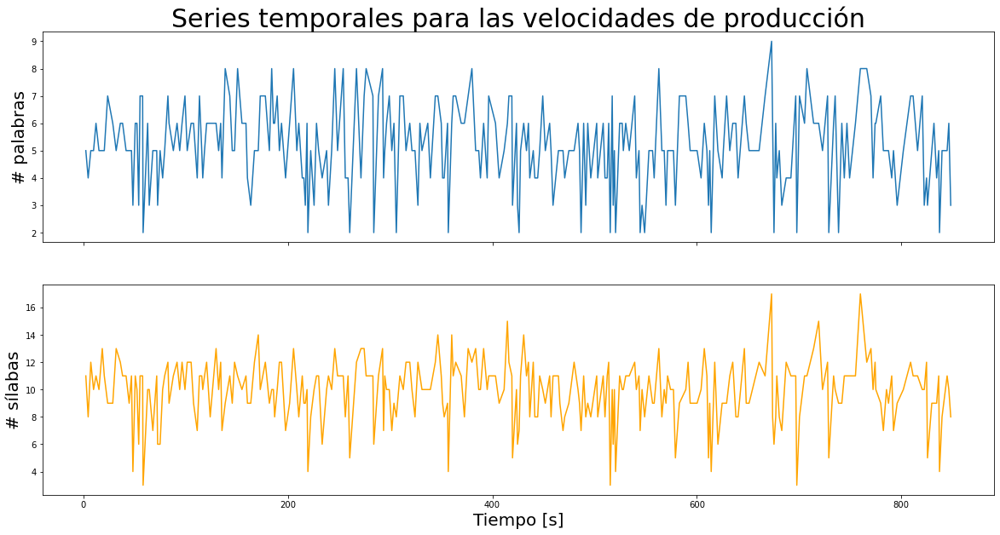

In [ ]:
import matplotlib.pyplot as plt
plt.figure()

fig, ax = plt.subplots(figsize=(20, 10), ncols=1, nrows=2, sharex=True)

ax[0].set_title('Series temporales para las velocidades de producción', size=30)

ax[0].plot(np.cumsum(df_syl['seconds']), df_syl['# words'])
ax[0].set_ylabel('# palabras',size=20);

ax[1].plot(np.cumsum(df_syl['seconds']), df_syl['# syllabes'], color = 'orange')
ax[1].set_ylabel('# sílabas',size=20);
ax[1].set_xlabel('Tiempo [s]',size=20);


print(u'Palabras/minuto:{:.2f} \u00B1 {:f}'.format(np.mean(df_syl['ratio w/sec']*60), np.std(df_syl['ratio w/sec']*60)))